In [1]:
%load_ext autoreload

In [2]:
%autoreload 2

# MobVis
## Use case example

### 1. Importing the modules:

In [3]:
# Pandas is used to read the files from the computer
import pandas as pd

# The Parser module is used to convert the raw data to a standard format
from mobvis.preprocessing.parser import Parser as par

# The Locations module is used to find the Geo-locations of the trace, used by almost all metrics
from mobvis.metrics.utils.Locations import Locations as loc
# The HomeLocations module is used to find the Home-locations of the trace, used by some metrics
from mobvis.metrics.utils.HomeLocations import HomeLocations as hloc
# The Contacts module is used to detect the Contacts between the nodes, used by Social metrics
from mobvis.metrics.utils.Contacts import Contacts as cnt

# The MetricBuilder module can be used to instantiate all the metrics 
from mobvis.metrics.utils.MetricBuilder import MetricBuilder as mb

# The metric and spatial plotters contains all the visualizations of MobVis
from mobvis.plots.metric_plotter import *
from mobvis.plots.spatial_plotter import *

### 2. Reading the raw example trace:

In [4]:
trace = pd.read_csv('san_francisco_cab.csv', names=['lat', 'lng', 'id', 'timestamp'], delimiter=',')

trace.head()

,lat,lng,id,timestamp
0,37.75153,-122.39447,0,1211033530
1,37.75149,-122.39447,0,1211033614
2,37.75149,-122.39447,0,1211033674
3,37.75149,-122.39446,0,1211033735
4,37.75144,-122.39449,0,1211035303


### 3. Parsing the raw trace:

In [5]:
parsed_trace = par.parse(raw_trace=trace, is_ordered=True) # See the `parse` method docstring for more information

parsed_trace.head()

Parsing the given DataFrame...
Checking the raw trace columns...
Fixing the timestamps...
Shorter timestamp: 1211018404.0
Timestamps fixed!

Successfully parsed!

         id  timestamp          x         y
0         0    15126.0 -122.39447  37.75153
1         0    15210.0 -122.39447  37.75149
2         0    15270.0 -122.39447  37.75149
3         0    15331.0 -122.39446  37.75149
4         0    16899.0 -122.39449  37.75144
...      ..        ...        ...       ...
1058673  49  2070699.0 -122.39490  37.75134
1058674  49  2070760.0 -122.39492  37.75130
1058675  49  2070820.0 -122.39482  37.75144
1058676  49  2070881.0 -122.39489  37.75134
1058677  49  2070942.0 -122.39493  37.75129

[1058678 rows x 4 columns]

Elapsed time: 22.402968883514404 seconds.



,id,timestamp,x,y
0,0,15126.0,-122.39447,37.75153
1,0,15210.0,-122.39447,37.75149
2,0,15270.0,-122.39447,37.75149
3,0,15331.0,-122.39446,37.75149
4,0,16899.0,-122.39449,37.75144


### 4. Finding the requirements for the metrics (Geo-locations, Home-locations and Contacts):

In [6]:
[trace_loc, loc_centers] = loc.find_locations(trace=parsed_trace, max_d=20, pause_threshold=10, dist_type="haversine")

trace_loc.head()

Finding the stay and geo locations...

Parameters:
Max Distance: 20
Pause Threshold: 10
Distance Formula: haversine
         id          x         y     sl    gl      index  timestamp
0         0 -122.39447  37.75153      0  True        0.0    15126.0
1         0 -122.39447  37.75149      0  True        1.0    15210.0
2         0 -122.39447  37.75149      0  True        2.0    15270.0
3         0 -122.39446  37.75149      0  True        3.0    15331.0
4         0 -122.39449  37.75144      0  True        4.0    16899.0
...      ..        ...       ...    ...   ...        ...        ...
1058673  49  -122.3949  37.75134  11097  True  1058673.0  2070699.0
1058674  49 -122.39492   37.7513  11097  True  1058674.0  2070760.0
1058675  49 -122.39482  37.75144  11097  True  1058675.0  2070820.0
1058676  49 -122.39489  37.75134  11097  True  1058676.0  2070881.0
1058677  49 -122.39493  37.75129  11097  True  1058677.0  2070942.0

[1058678 rows x 7 columns]
Locations found!

Elapsed time: 278.1843

,id,x,y,sl,gl,index,timestamp
0,0,-122.39447,37.75153,0,True,0.0,15126.0
1,0,-122.39447,37.75149,0,True,1.0,15210.0
2,0,-122.39447,37.75149,0,True,2.0,15270.0
3,0,-122.39446,37.75149,0,True,3.0,15331.0
4,0,-122.39449,37.75144,0,True,4.0,16899.0


In [7]:
trace_homes = hloc.find_homes(trace_loc=trace_loc)

trace_homes.head()

Finding the Home Locations...
Home locations found!

Elapsed time: 38.80843544006348 seconds.



,id,home_location,x,y
0,0,15754,-122.39506,37.7514
1,1,51,-122.39427,37.75156
2,2,3798,-122.39359,37.75067
3,3,15213,-122.39399,37.75183
4,4,4995,-122.39395,37.75158


In [8]:
trace_contacts = cnt.detect_contacts(parsed_trace, radius=15, dist_type="haversine")

Detecting the contacts between the nodes...

Parameters:
Contact Radius: 15
Distance Formula: haversine
Contacts Detected!
    id1   id2        x1         y1        x2         y2 timestamp
0   0.0  22.0  37.79595 -122.42189  37.79592 -122.42181   41835.0
1   0.0  25.0   37.7513 -122.39495  37.75132  -122.3949  123748.0
2   0.0  25.0  37.75126 -122.39492   37.7513 -122.39487  126773.0
3   7.0  41.0  37.75138   -122.395  37.75138 -122.39506  254624.0
4  38.0  44.0  37.75143 -122.39441  37.75133 -122.39446  259750.0
Number of contacts: 262

Elapsed time: 1284.581932067871 seconds.



### 5. Extracting the metrics:

In [9]:
trace_trvd = mb.build_metric('TRVD', trace_loc=trace_loc, dist_type="haversine").extract()
trace_radg = mb.build_metric('RADG', trace=parsed_trace, trace_loc=trace_loc, sl_centers=loc_centers, homes=trace_homes, dist_type="haversine").extract()
trace_viso = mb.build_metric('VISO', trace_loc=trace_loc).extract()
trace_vist = mb.build_metric('VIST', trace_loc=trace_loc).extract()
trace_trvt = mb.build_metric('TRVT', trace_loc=trace_loc).extract()
trace_inco = mb.build_metric('INCO', contacts_df=trace_contacts).extract()


Extracting the Travel Distance...
Travel Distance extracted successfully!


Elapsed time: 5.919878244400024 seconds.


Extracting the Radius of Gyration...
Radius of Gyration extracted successfully!

Elapsed time: 38.55942916870117 seconds.


Extracting the Visit Order...
Visit Order extracted successfully!

Elapsed time: 8.010273218154907 seconds.

Extracting the Visit Time...
Visit Time extracted successfully!


Elapsed time: 5.72978663444519 seconds.


Extracting the Travel Time...
Travel Distance extracted successfully!


Elapsed time: 5.292661905288696 seconds.


Extracting the Inter-contact Time...

Inter-contact Time extracted successfully!

Elapsed time: 0.0380091667175293 seconds.



#### Some tabular data examples:

In [10]:
trace_trvd.head()

,id,travel_distance,init_sl,final_sl,ix,iy,fx,fy
0,0,11.9569002971,0,494,-122.39453,37.75151,-122.39458,37.75141
1,0,25.2373378205,494,496,-122.39459,37.75143,-122.39487,37.75138
2,0,1401.36945364,496,863,-122.39487,37.75121,-122.41069,37.75275
3,0,1412.1556589049,863,978,-122.41068,37.75277,-122.39472,37.75134
4,0,12.7578213516,978,980,-122.39486,37.75139,-122.39495,37.7513


In [11]:
trace_radg.head()

,id,home_location,radius_of_gyration
0,0,15754,5255.4703217391
1,1,51,1565.8357108981
2,2,3798,9162.7930494811
3,3,15213,7040.2234521957
4,4,4995,7094.3630410841


In [12]:
trace_trvt.head()

,id,init_sl,final_sl,t_exit,t_arrival,travel_time
0,0,0,494,16970.0,51565.0,34595.0
1,0,494,496,55276.0,55360.0,84.0
2,0,496,863,56185.0,79544.0,23359.0
3,0,863,978,80711.0,120711.0,40000.0
4,0,978,980,122761.0,123748.0,987.0


In [13]:
trace_viso.head()

,id,x,y,sl,visit_order,timestamp
0,0,-122.39447,37.75153,0,1.0,15126.0
616,0,-122.39458,37.75141,494,2.0,51565.0
677,0,-122.39487,37.75138,496,3.0,55360.0
1129,0,-122.41069,37.75275,863,4.0,79544.0
1299,0,-122.39472,37.75134,978,5.0,120711.0


In [14]:
trace_inco.head()

,id1,id2,intercontact_time
0,0.0,1.0,8680.0
1,0.0,1.0,60.0
2,0.0,7.0,121.0
3,0.0,25.0,3025.0
4,0.0,25.0,557974.0


### 6. Visualizing the data:

#### Trace Plots:


Successfully generated plot!


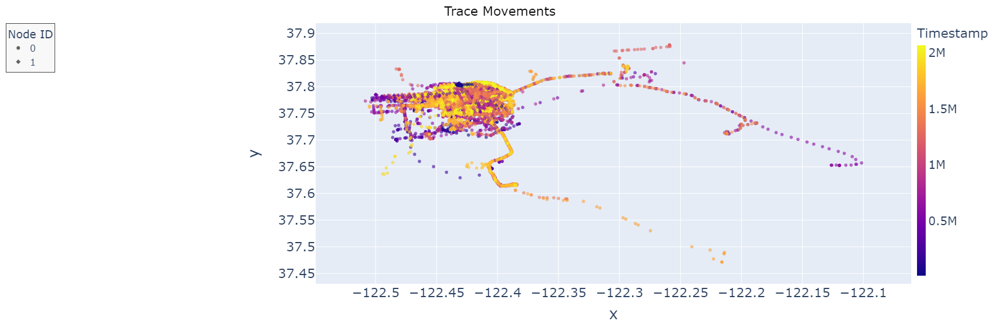

In [35]:
fig = plot_trace(
    trace=parsed_trace,
    users_to_display=2
)

fig.show()


Successfully generated plot!


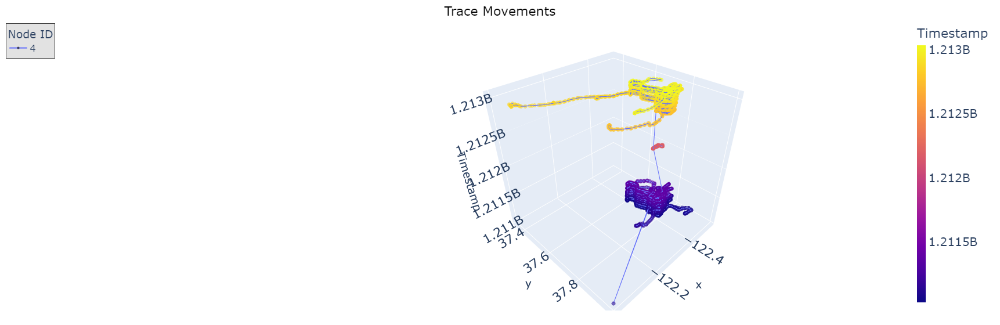

In [16]:
# On this plot, the nodes to be shown are specified by the `nodes_list` parameter
fig = plot_trace3d(trace=trace, specific_users=[4], show_y_label=False)

fig.show()

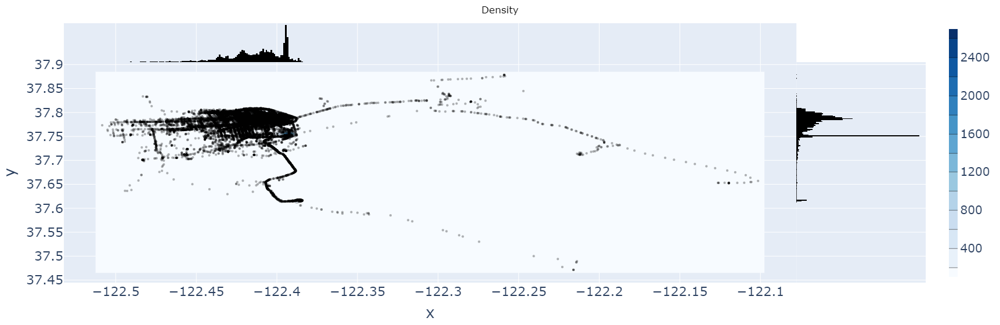

In [17]:
# This graph is showing the density of all the movements of 50 of the 100 nodes on the trace
fig = plot_density(trace=trace, users_to_display=1)

fig.show()


Generating the Visit Order plot...


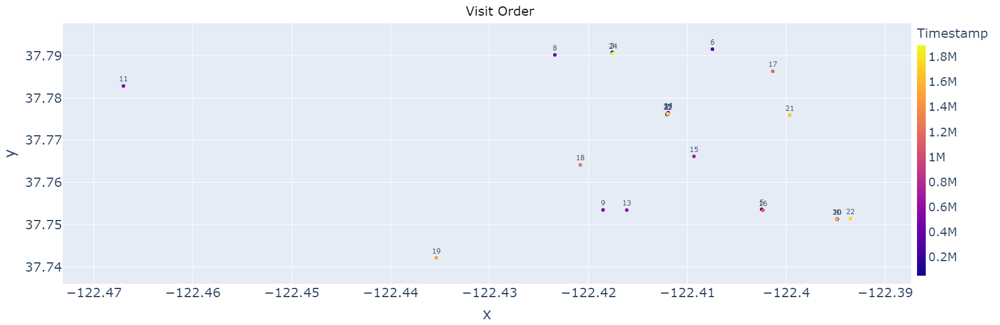

In [18]:
# Geo-locations visited by the 1º node in order
fig = plot_visit_order(trace_viso=trace_viso, specific_users=[10])

fig.show()

#### Metrics Plots:

Generating the TRVD histogram...

Successfully generated histogram!

Elapsed time: 2.015451431274414 seconds.



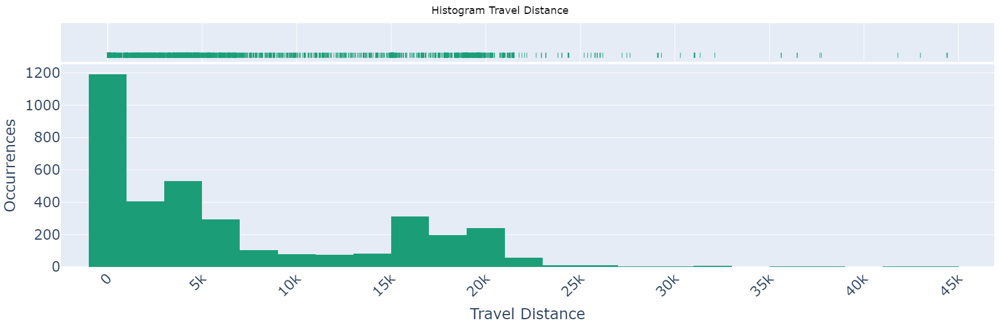

In [19]:
fig = plot_metric_histogram(
    trace_trvd,
    metric_name='TRVD',
    differ_nodes=False,
    show_title=True,
    show_y_label=True,
    nbins=30
)

fig.show()

Generating the RADG boxplot...

Successfully generated boxplot!

Elapsed time: 0.0780172348022461 seconds.



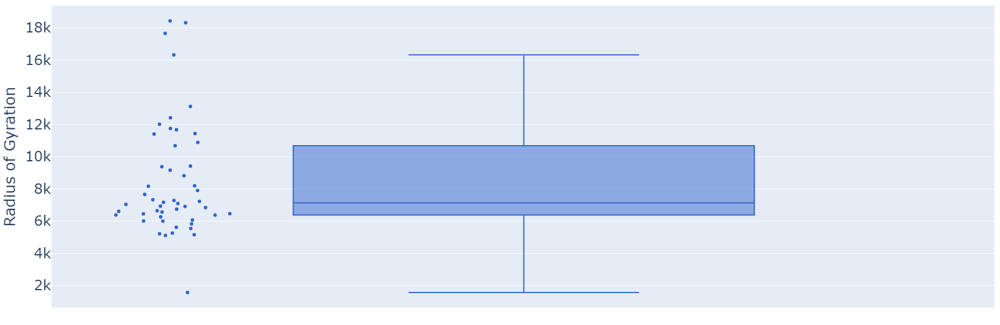

In [20]:
fig = boxplot_metric(
    trace_radg,
    metric_name='RADG',
    differ_nodes=False,
    show_title=False,
    show_y_label=True
)

fig.show()

Generating the TRVT distplot...
3787.132479062864

Successfully generated distplot!


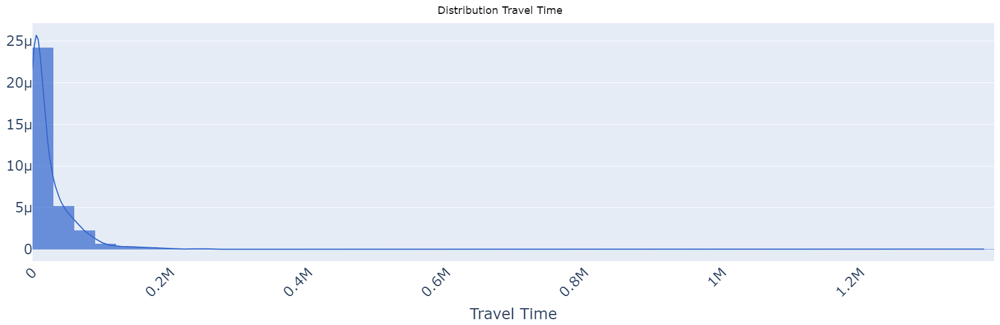

In [34]:
fig = plot_metric_dist(
    trace_trvt,
    metric_name='TRVT',
    differ_nodes=False,
    show_title=True,
    show_y_label=True
)

fig.show()

Generating the INCO histogram...

Successfully generated histogram!

Elapsed time: 0.045038461685180664 seconds.



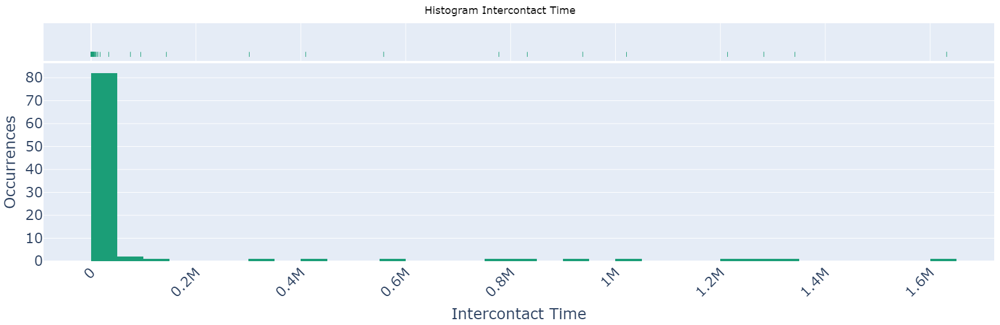

In [33]:
fig = plot_metric_histogram(
    trace_inco,
    metric_name='INCO',
    differ_nodes=False,
    show_title=True,
    show_y_label=True,
    nbins=50
)

fig.show()

### 7. Exporting the data:

In [22]:
from mobvis.utils.Exports import export_dataframe
from mobvis.utils.Exports import export_figure

In [23]:
export_dataframe(df=trace_trvd, path='travel_distance.xlsx')

In [24]:
export_figure(figure=fig, path='distplot.png')